In [1]:
import matplotlib.pyplot as plt
import numpy as np


from PIL import Image
import pandas as pd

import os
from pathlib import Path
import glob
import pickle

import sys
sys.path.append('/storage3/eva/code/remapping/src')
import path_formatting as pf
import motive
import utils
import oe

In [8]:
date = "20250922" # change this according to ur session
animal = "eb03"

oe_sr = 30000
m_sr = 120

_, ks_path, csv_path, res_path = utils.path_load(date, animal,p=True)

units_path = Path(res_path) / 'units_summary'
os.makedirs(units_path, exist_ok=True) # Create the folder if it doesn't exist

pitch_path = Path(res_path) / "pitch"
pf_path = Path(res_path) / "pf"

Ola! For folders inside of res_path: Path(res_path)/"folder_name"
To make new folder (if not exist): your_path.mkdir(parents=True, exist_ok=True)


## Normal way

In [4]:
# clusters info
goodspiketimes = oe.ks_load(ks_path)
uoi = list(goodspiketimes.keys())

with open(Path(f'{res_path}/preprocessing') / f"behav_periods_{animal}_{date}.pkl", "rb") as f:
    periods = pickle.load(f)
    
Clusterinfofile = ks_path+"/cluster_info.tsv"
Clusterinfo = pd.read_csv(Clusterinfofile,sep='\t')

Sup! U have...
59 phy-good clusters


In [6]:
# Calculate number of spikes for each unit within each period
spikes_per_period = {}
for unit, spiketimes in goodspiketimes.items():
    spikes_per_period[unit] = {}
    for period in periods.keys():
        start, end = periods[period][0], periods[period][1]
        # Count spikes within the period
        count = np.sum((spiketimes >= start) & (spiketimes < end))
        spikes_per_period[unit][period] = count
        
features = ['cluster_id','Amplitude', 'ContamPct', 'fr', 'n_spikes']
df = Clusterinfo.loc[Clusterinfo['cluster_id'].isin(uoi), features] 
df

# Add columns from spikes_per_period to df
for period in next(iter(spikes_per_period.values())).keys():
    df[period] = df['cluster_id'].map(lambda cid: spikes_per_period.get(cid, {}).get(period, np.nan))
clusters_info = df

In [9]:
# load data needed

res_path_path = Path(res_path)

# anat
with open(res_path_path/f"shanks_loc_{animal}_{date}.pkl", "rb") as f:
    shanks_loc = pickle.load(f)

# wf
with open(res_path + "/mean_wf_all_expanded.pkl", "rb") as f:
    mean_wf_all = pickle.load(f) # keys units ids

with open(res_path + "/wf_all_expanded.pkl", "rb") as f:
    wf_all = pickle.load(f)

# acg
acg_path = res_path+'/acg'
with open(f"{acg_path}/acg_{animal}_{date}.pkl", "rb") as f:
    acg_dict = pickle.load(f)

# normal rate maps
ofs = ['of1', 'of2', 'of3']
speed_cutoff = 0.02
rm_dict = {}
for of in ofs:
    with open(f"{pf_path}/pf_data_dict_{of}_{date}.pkl", "rb") as f:
        rm_dict[of] = pickle.load(f)

# rate maps for low and high pitch
rm_dict_pitch = {}
for of in ofs:
    with open(f"{pitch_path}/pf_data_dict_{of}_{date}.pkl", "rb") as f:
        rm_dict_pitch[of] = pickle.load(f)

# rate maps in behavioral space
rm_dict_pitch1D = {}
for of in ofs:
    with open(f"{pitch_path}/pf_data_dict1d_{of}_{date}.pkl", "rb") as f:
        rm_dict_pitch1D[of] = pickle.load(f)

In [10]:
units = list(rm_dict['of1'].keys())

In [11]:
from matplotlib.gridspec import GridSpec
import matplotlib.cm as cm
from matplotlib.colors import Normalize

In [12]:
def plot_cluster_metadata(ax, unit, clusters_info):
    ax.axis('off')
    info = clusters_info[clusters_info['cluster_id'] == unit].iloc[0]
    info_str = (
        f"Unit {unit}\n\n"
        f"Firing rate:   {info['fr']:.2f} Hz\n"
        f"Amplitude:     {info['Amplitude']:.1f} µV\n"
        f"Contam:        {info['ContamPct']:.1f} %\n"
        f"Spikes total:  {int(info['n_spikes'])}\n\n"
        f"{'Period':<10}{'SpkCount':>8}\n"
        f"{'sl1':<10}{int(info['sl1']):>8}\n"
        f"{'of1':<10}{int(info['of1']):>8}\n"
        f"{'sl2':<10}{int(info['sl2']):>8}\n"
        f"{'of2':<10}{int(info['of2']):>8}\n"
        f"{'sl3':<10}{int(info['sl3']):>8}\n"
        f"{'of3':<10}{int(info['of3']):>8}\n"
        f"{'sl4':<10}{int(info['sl4']):>8}"
    )
    ax.text(0.05, 0.95, info_str, fontsize=11, va='top', ha='left', family='monospace', transform=ax.transAxes)

In [13]:
def plot_cluster_metadata(ax, unit, clusters_info):
    ax.axis('off')
    info = clusters_info[clusters_info['cluster_id'] == unit].iloc[0]

    info_str = (
        f"Unit {unit}\n\n"
        f"Firing rate:   {info['fr']:.2f} Hz\n"
        f"Amplitude:     {info['Amplitude']:.1f} µV\n"
        f"Contam:        {info['ContamPct']:.1f} %\n"
        f"Spikes total:  {int(info['n_spikes'])}\n\n"
        f"sl1:{int(info['sl1'])} | sl2:{int(info['sl2'])} | sl3:{int(info['sl3'])}\n"
        f"of1:{int(info['of1'])} | of2:{int(info['of2'])} | of3:{int(info['of3'])}"
    )

    ax.text(0.05, 0.95, info_str, fontsize=11, va='top', ha='left', family='monospace', transform=ax.transAxes)


In [14]:
def plot_shank_position(ax, unit, shanks_loc):
    shank_map = {0: 0.5, 1: 1.0, 2: 1.5, 3: 2.0}
    unit_ids = shanks_loc[:, 0]
    depths = shanks_loc[:, 1]
    shanks_raw = shanks_loc[:, 2]
    shanks = np.array([shank_map[s] for s in shanks_raw])

    for unit_id, depth, shank in zip(unit_ids, depths, shanks):
        if unit_id != unit:
            ax.scatter(shank, depth, color='lightgrey', s=50, alpha=0.9)
    i = np.where(unit_ids == unit)[0][0]
    ax.scatter(shanks[i], depths[i], color='black', s=80, edgecolors='black')
    ax.set_xticks([0.5, 1.0, 1.5, 2.0])
    ax.set_xticklabels(['1', '2', '3', '4'])
    ax.invert_yaxis()
    ax.set_title('Shank location')
    ax.set_xlabel('Shank')
    ax.set_ylabel('Depth [µm]')
    ax.grid(True)

In [15]:
def plot_waveform(ax, unit, wf_all, mean_wf_all):
    waveforms = wf_all[unit]
    mean_wf = mean_wf_all[unit]
    n_samples = waveforms.shape[1]
    t = (np.arange(n_samples) - 30) / 30000 * 1000  # ms
    ax.plot(t, waveforms.T, color='lightgrey', linewidth=0.5, alpha=0.5)
    ax.plot(t, mean_wf, color='C0', linewidth=2)
    ax.set_xlabel("Time [ms]")
    ax.set_ylabel("Amplitude [µV]")
    ax.set_title("Raw waveform")
    ax.grid(True)

In [16]:
def plot_acg(ax, unit, acg_dict):
    lags, acorr = acg_dict[unit]['lags'], acg_dict[unit]['acg']
    ax.bar(lags, acorr, width=1, color='black')
    ax.set_title('ACG')
    ax.set_xlabel('Lag [ms]')
    ax.set_ylabel('Count')
    ax.set_xlim(-50, 50)

In [17]:
def plot_place_field_map(ax, unit, rm_dict, plotting_essentials, of, cmap):
    rm = rm_dict[of]['rm'][unit]
    x_edges = rm_dict[of]['x_edges']
    z_edges = rm_dict[of]['z_edges']

    im = ax.imshow(rm.T, origin='lower',
                    extent=[x_edges[0], x_edges[-1], z_edges[0], z_edges[-1]],
                    aspect='auto', cmap=cmap)
    ax.set_title(f'{of} rate map')
    ax.set_xlabel('X [m]')
    ax.set_ylabel('Z [m]')
    return im

In [18]:
def plot_pitch_split_maps(ax_low, ax_high, unit, rm_dict_pitch, of, cmap):
    pitch_data = rm_dict_pitch[of]
    x_edges = pitch_data['x_edges']
    z_edges = pitch_data['z_edges']

    maps = []
    for label in ['low_pitch', 'high_pitch']:
        key = (label, 'rm', unit)
        if key in pitch_data:
            maps.append(pitch_data[key])

    if maps:
        all_vals = np.concatenate([m.ravel() for m in maps])
        pmin, pmax = np.nanpercentile(all_vals, 1), np.nanpercentile(all_vals, 99)
    else:
        pmin, pmax = 0, 1

    im_low = im_high = None

    # Low pitch
    key_low = ('low_pitch', 'rm', unit)
    if key_low in pitch_data:
        rate_map = pitch_data[key_low]
        im_low = ax_low.imshow(rate_map.T, origin='lower',
                               extent=[x_edges[0], x_edges[-1], z_edges[0], z_edges[-1]],
                               aspect='auto', cmap=cmap, vmin=pmin, vmax=pmax)
    else:
        ax_low.text(0.5, 0.5, 'No data', ha='center', va='center')
        ax_low.set_facecolor('lightgrey')

    ax_low.set_title(f'{of} low pitch')
    ax_low.set_xlabel('X'); ax_low.set_ylabel('Z')

    # High pitch
    key_high = ('high_pitch', 'rm', unit)
    if key_high in pitch_data:
        rate_map = pitch_data[key_high]
        im_high = ax_high.imshow(rate_map.T, origin='lower',
                                 extent=[x_edges[0], x_edges[-1], z_edges[0], z_edges[-1]],
                                 aspect='auto', cmap=cmap, vmin=pmin, vmax=pmax)
    else:
        ax_high.text(0.5, 0.5, 'No data', ha='center', va='center')
        ax_high.set_facecolor('lightgrey')

    ax_high.set_title(f'{of} high pitch')
    ax_high.set_xlabel('X'); ax_high.set_ylabel('Z')

    return im_low, im_high

In [19]:
def plot_1d_pitch_tuning(ax, unit, rm_dict_pitch1D, of, vmin, vmax, ymax, om_max, cmap):
    data = rm_dict_pitch1D[of]
    pitch_centers = data['pitch_centers']
    firing_rates = data['rm'][unit]
    occupancy = data['om']

    # Normalize color by firing rate
    norm = Normalize(vmin=vmin, vmax=vmax)
    colors = [
        'lightgrey' if np.isnan(val) else cmap(norm(val))
        for val in firing_rates
    ]

    # Main bar plot for firing rate
    ax.bar(pitch_centers, np.nan_to_num(firing_rates), width=5.0, color=colors, edgecolor='k')
    ax.set_xlabel('Head pitch [°]')
    ax.set_ylabel('FR (Hz)', color='k')
    ax.set_ylim(0, ymax * 1.05)
    ax.set_title(f'{of} pitch tuning')

    # Secondary y-axis for occupancy
    ax2 = ax.twinx()
    ax2.plot(pitch_centers, occupancy, color='r', linewidth=1.5, label='Occupancy')
    ax2.set_ylabel('Occupancy (s)', color='r')
    ax2.set_ylim(0, om_max * 1.05)
    ax2.tick_params(axis='y', labelcolor='r')

In [20]:
def get_1d_pitch_vmin_vmax_per_unit(unit, rm_dict_pitch1D, ofs=['of1', 'of2', 'of3']):
    all_vals = []
    for of in ofs:
        if unit in rm_dict_pitch1D[of]['rm']:
            rate_map = rm_dict_pitch1D[of]['rm'][unit]
            all_vals.append(rate_map)
    if all_vals:
        all_vals = np.concatenate(all_vals)
        return np.nanpercentile(all_vals, 1), np.nanpercentile(all_vals, 99)
    else:
        return 0, 1

def get_1d_pitch_ymax_per_unit(unit, rm_dict_pitch1D, ofs=['of1', 'of2', 'of3']):
    max_vals = []
    for of in ofs:
        if unit in rm_dict_pitch1D[of]['rm']:
            rate_map = rm_dict_pitch1D[of]['rm'][unit]
            max_vals.append(np.nanmax(rate_map))
    return np.nanmax(max_vals) if max_vals else 1

In [21]:
def plot_summary_figure(unit,
                        shanks_loc,
                        clusters_info,
                        wf_all,
                        mean_wf_all,
                        acg_dict,
                        rm_dict,
                        rm_dict_pitch,
                        rm_dict_pitch1D,
                        animal=None,
                        date=None,
                        save_path=None,
                        ofs=['of1', 'of2', 'of3']):
    
    fig = plt.figure(figsize=(18, 14))
    gs = GridSpec(len(ofs)+1, 4, figure=fig, height_ratios=[1] + [1]*len(ofs), hspace=0.8, wspace=0.6)

    # === Row 1: metadata and waveform stuff ===
    plot_cluster_metadata(fig.add_subplot(gs[0, 0]), unit, clusters_info)
    plot_shank_position(fig.add_subplot(gs[0, 1]), unit, shanks_loc)
    plot_waveform(fig.add_subplot(gs[0, 2]), unit, wf_all, mean_wf_all)
    
    ax_acg = fig.add_subplot(gs[0, 3])
    plot_acg(ax_acg, unit, acg_dict)
    ax_acg.set_xlim(-50, 50)  # Show +/- 50 ms window

    # === Shared scaling params ===
    vmin, vmax = get_1d_pitch_vmin_vmax_per_unit(unit, rm_dict_pitch1D, ofs)
    ymax = get_1d_pitch_ymax_per_unit(unit, rm_dict_pitch1D, ofs)

    # Shared occupancy max across all trials
    om_max = 0
    for of in ofs:
        om = rm_dict_pitch1D[of]['om']
        if np.any(~np.isnan(om)):
            om_max = max(om_max, np.nanmax(om))

    cmap = cm.Spectral_r.copy()
    cmap.set_bad('lightgrey')

    # === Rows 2–N: per trial panels ===
    for i, of in enumerate(ofs):
        row = i + 1

        # A. 2D Place Field Map
        ax_pf = fig.add_subplot(gs[row, 0])
        im = plot_place_field_map(ax_pf, unit, rm_dict, rm_dict_pitch, of, cmap)
        fig.colorbar(im, ax=ax_pf, shrink=0.7)
        
        # B+C. Low and High Pitch Maps
        ax_low  = fig.add_subplot(gs[row, 1])
        ax_high = fig.add_subplot(gs[row, 2])
        im_low, im_high = plot_pitch_split_maps(ax_low, ax_high, unit, rm_dict_pitch, of, cmap)
        if im_low or im_high:
            fig.colorbar(im_low or im_high, ax=[ax_low, ax_high], shrink=0.7)

        # D. 1D Pitch Tuning + Occupancy
        ax_pitch = fig.add_subplot(gs[row, 3])
        plot_1d_pitch_tuning(ax_pitch, unit, rm_dict_pitch1D, of, vmin, vmax, ymax, om_max, cmap)

    # === Title & Save ===
    title_str = f'Unit {unit} Summary'
    if animal and date:
        title_str += f' | {animal}, {date}'
    fig.suptitle(title_str, fontsize=16)

    if save_path:
        fig.savefig(save_path / f'summary_unit{unit}.png', dpi=300, bbox_inches='tight')

    plt.show()

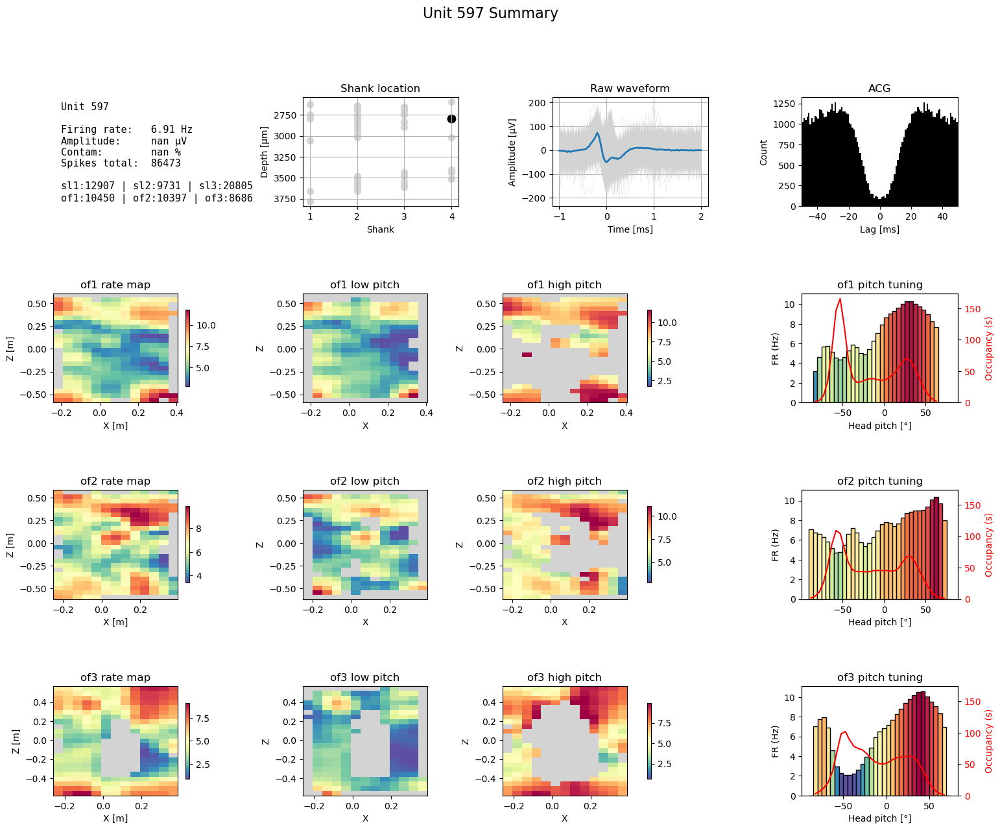

In [23]:
plot_summary_figure(uoi[1],
                    shanks_loc,
                    clusters_info,
                    wf_all,
                    mean_wf_all,
                    acg_dict,
                    rm_dict,
                    rm_dict_pitch,
                    rm_dict_pitch1D,
                    ofs=['of1', 'of2', 'of3'],
                    save_path=None)

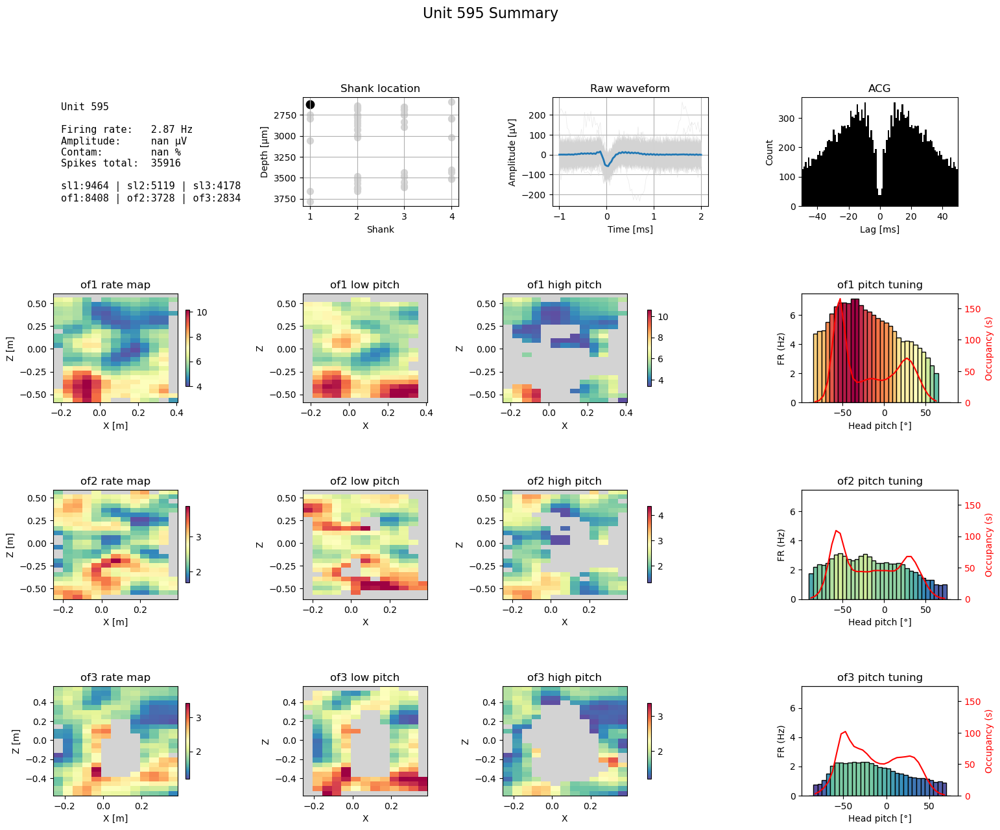

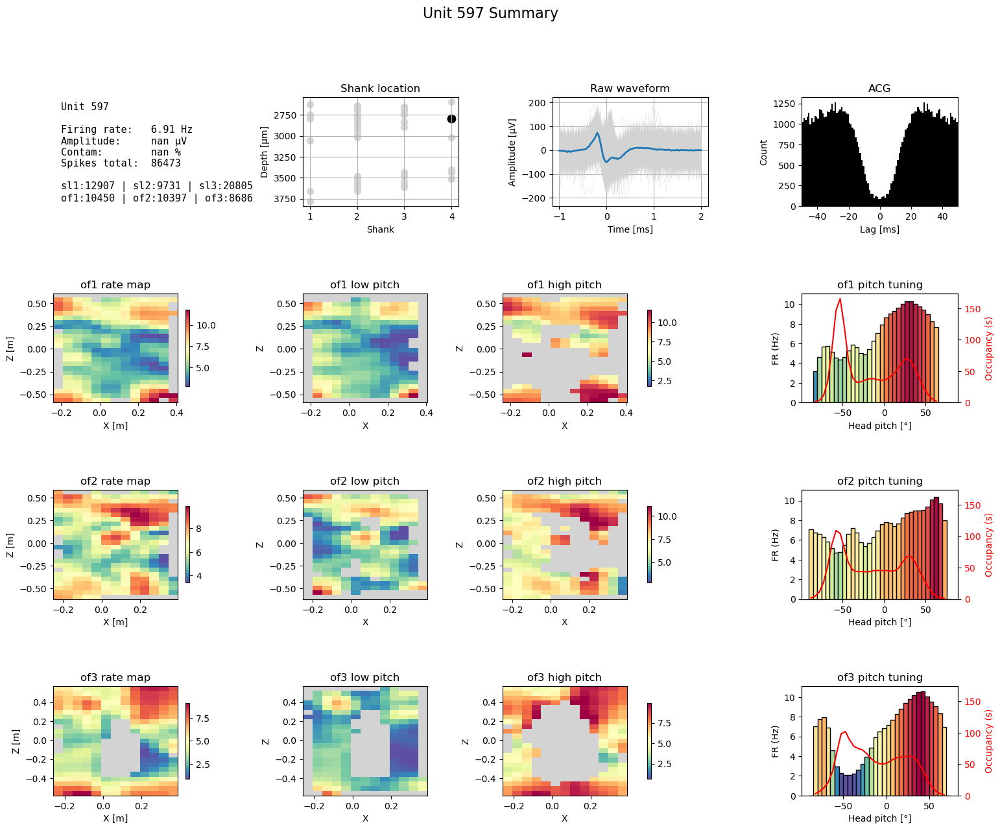

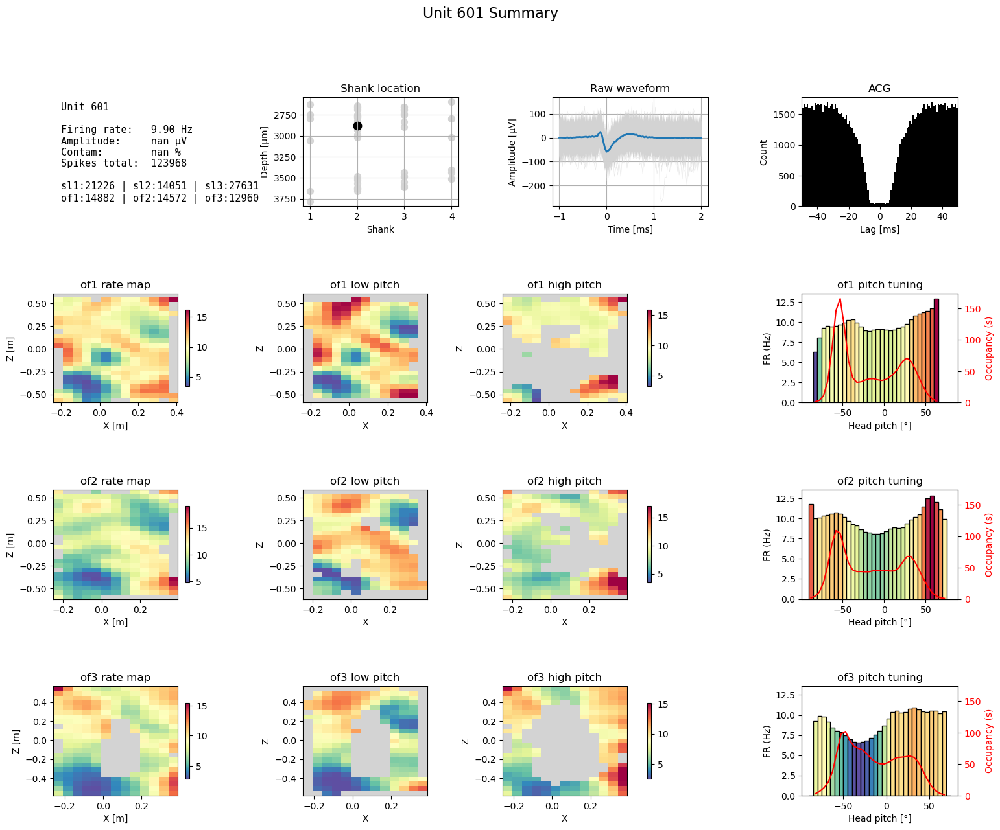

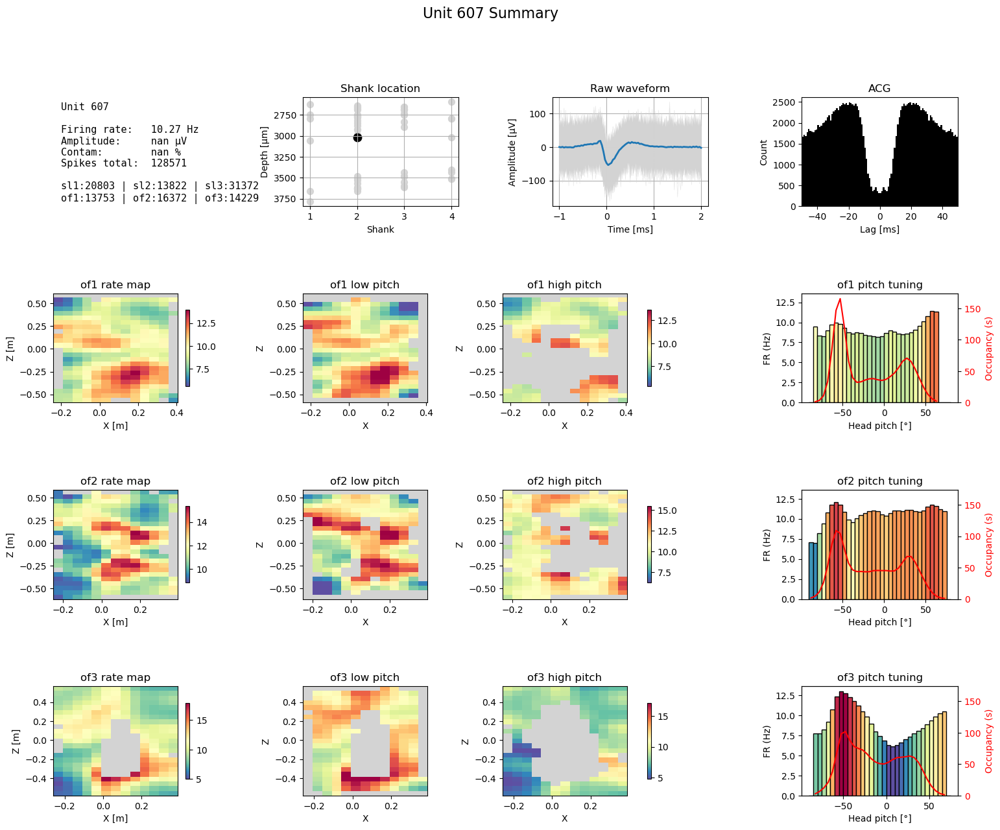

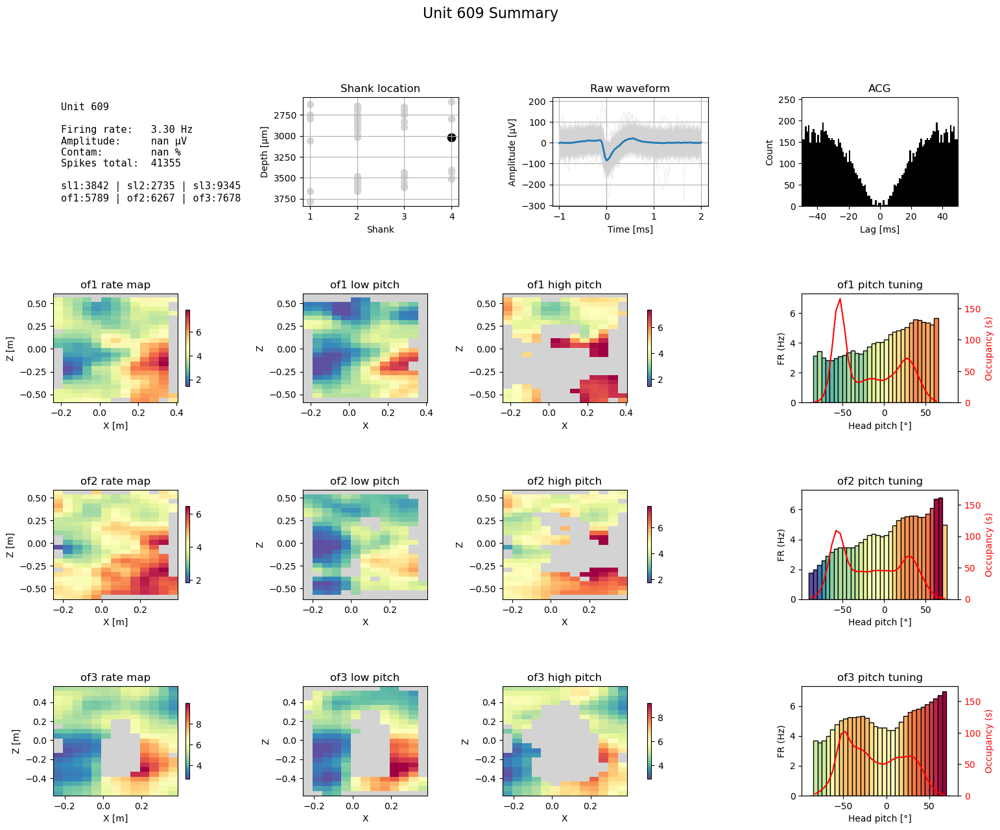

...

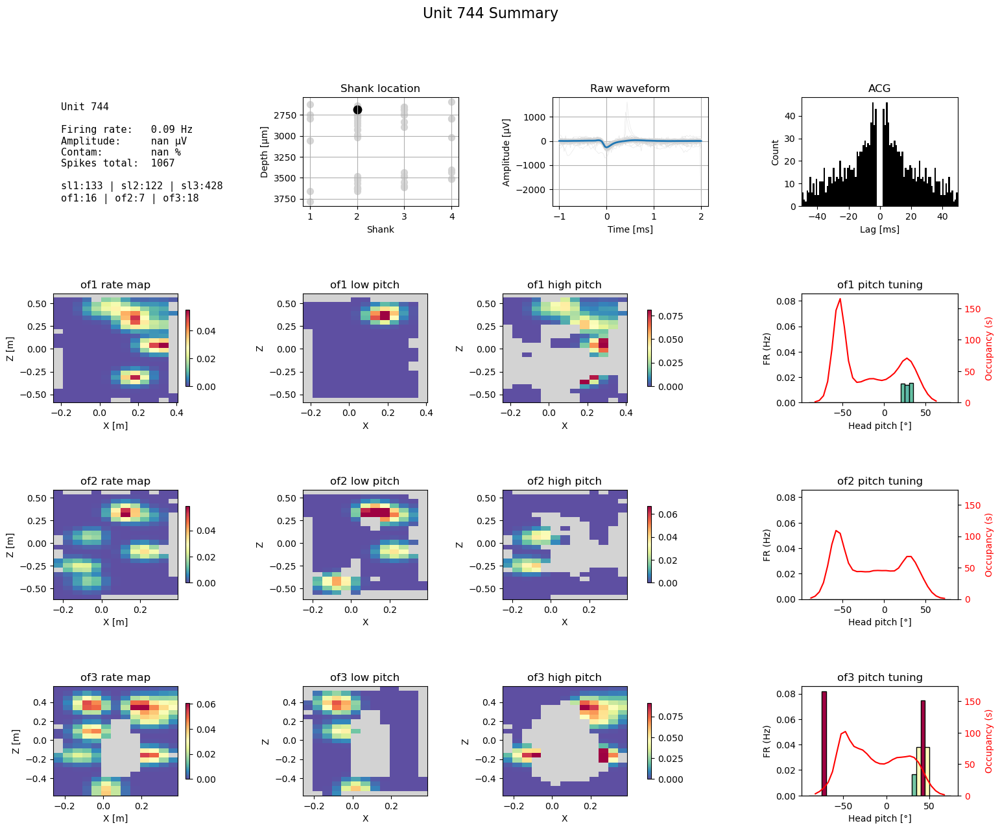

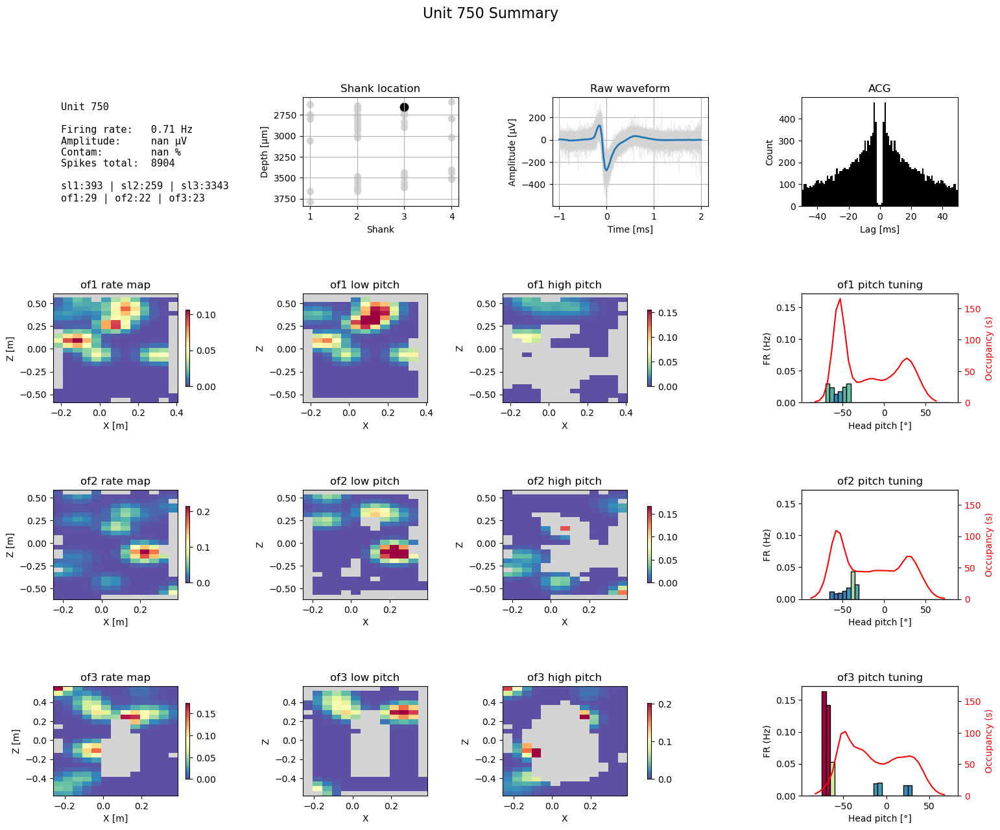

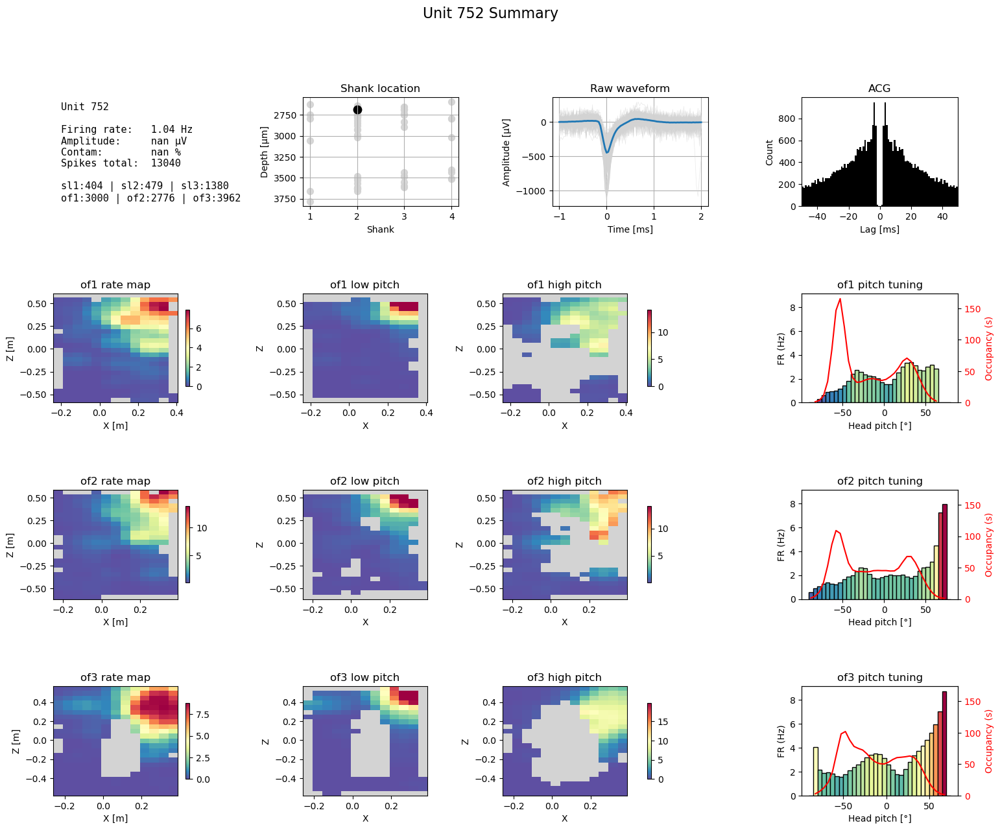

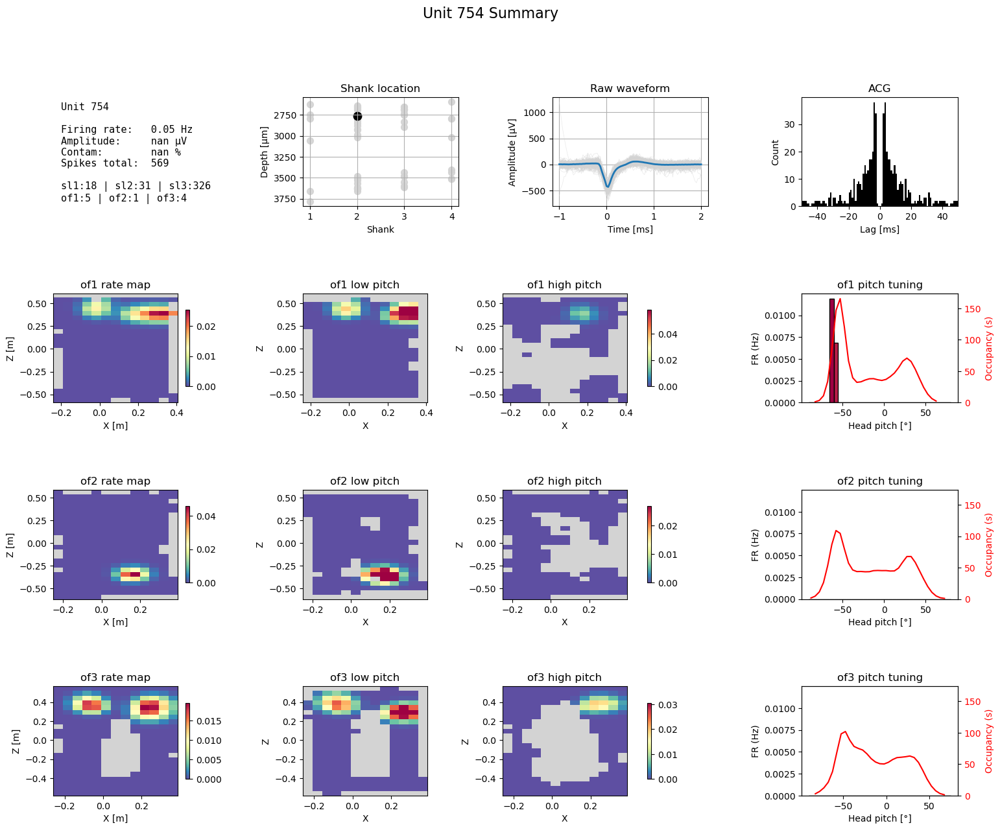

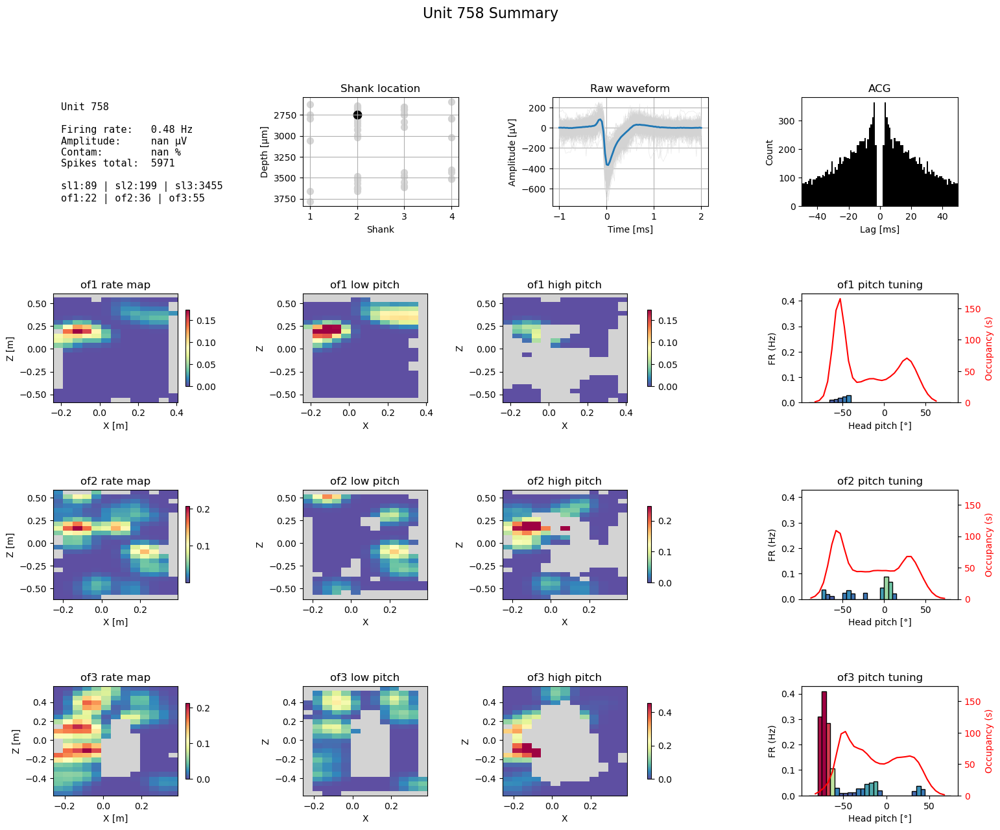

/tmp/ipykernel_4622/736241658.py:18: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(0, ymax * 1.05)


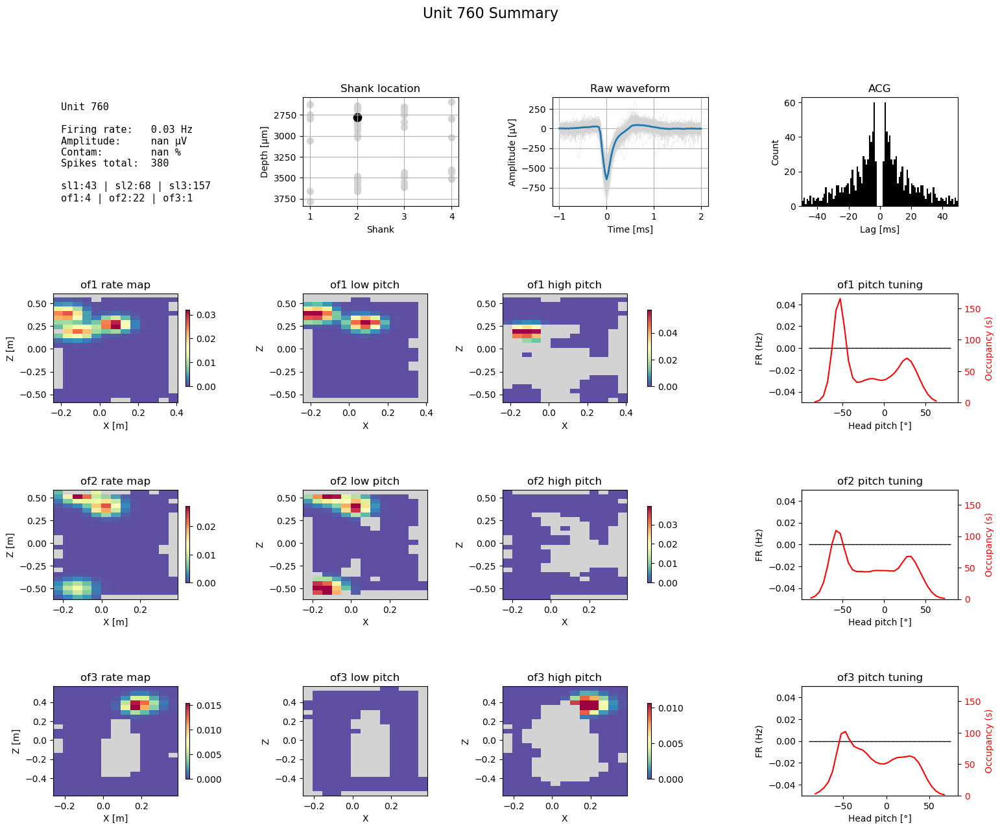

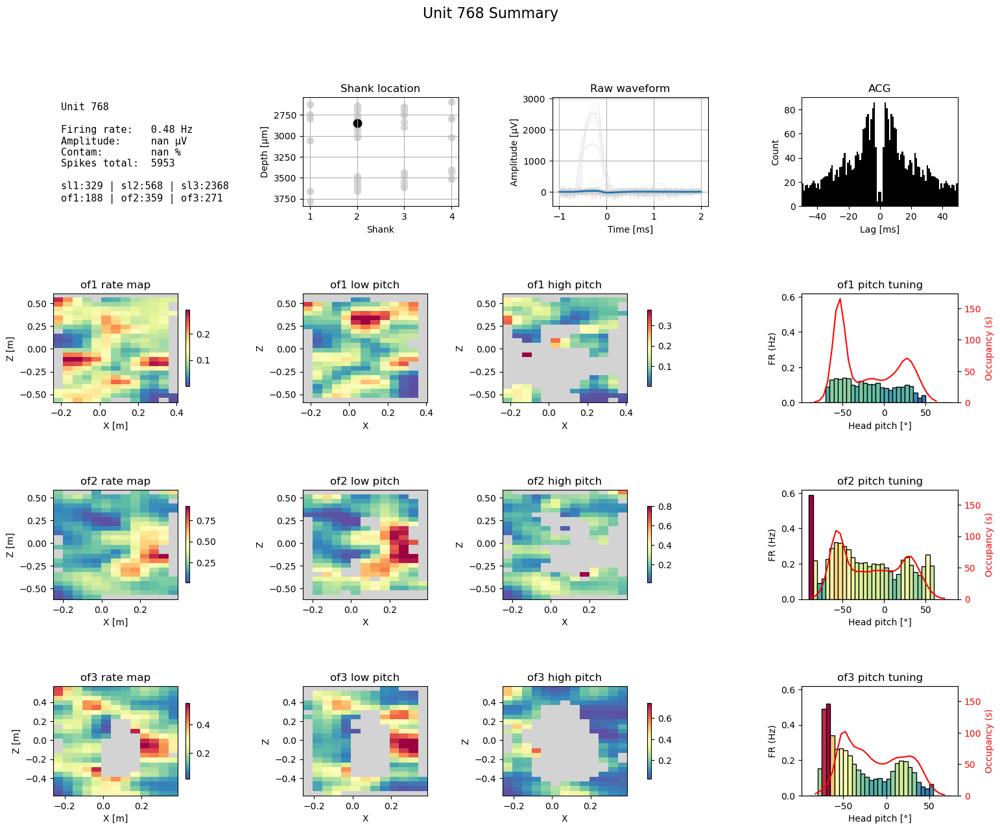

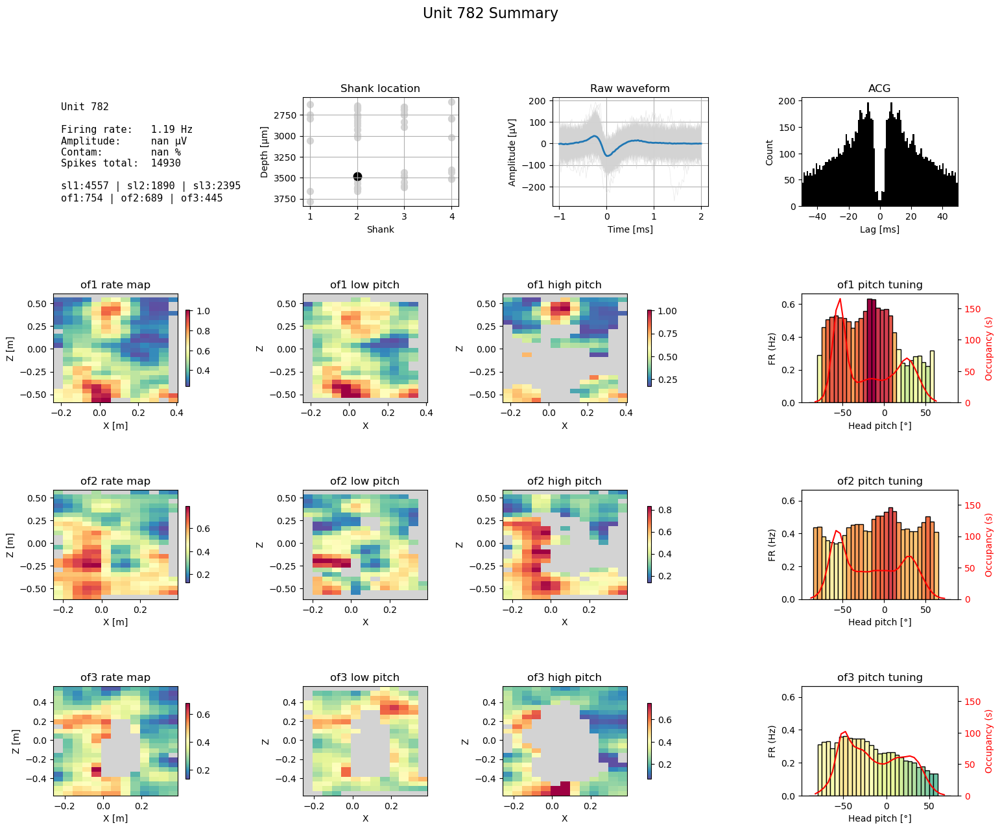

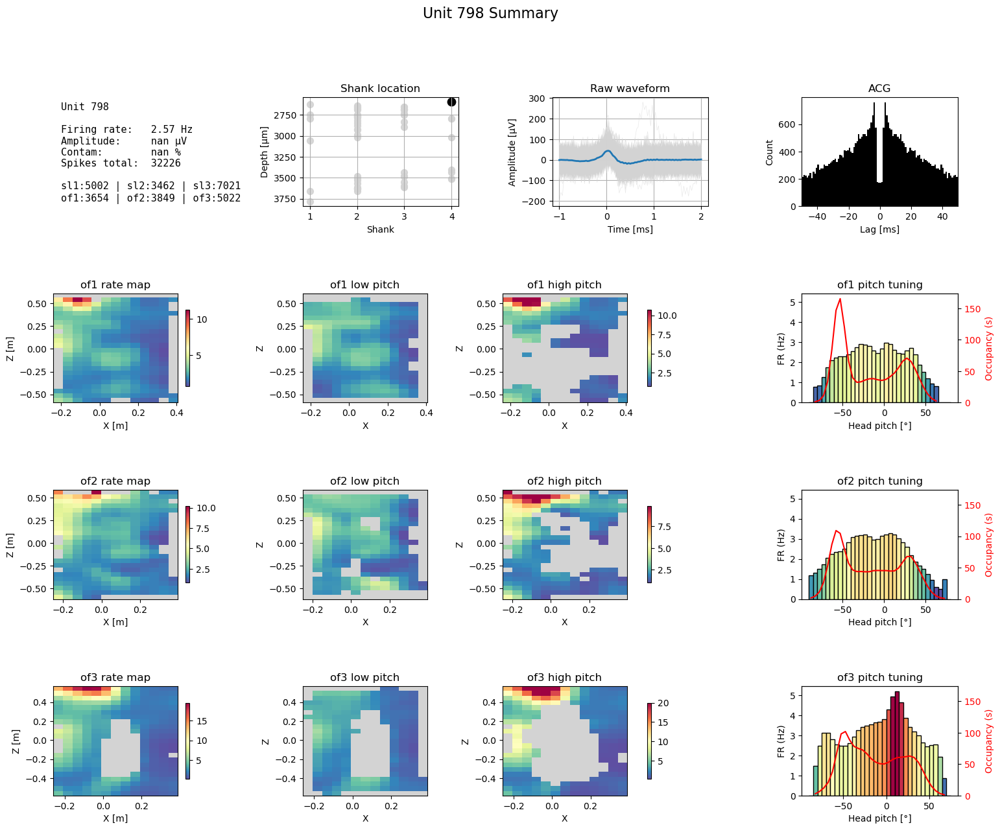

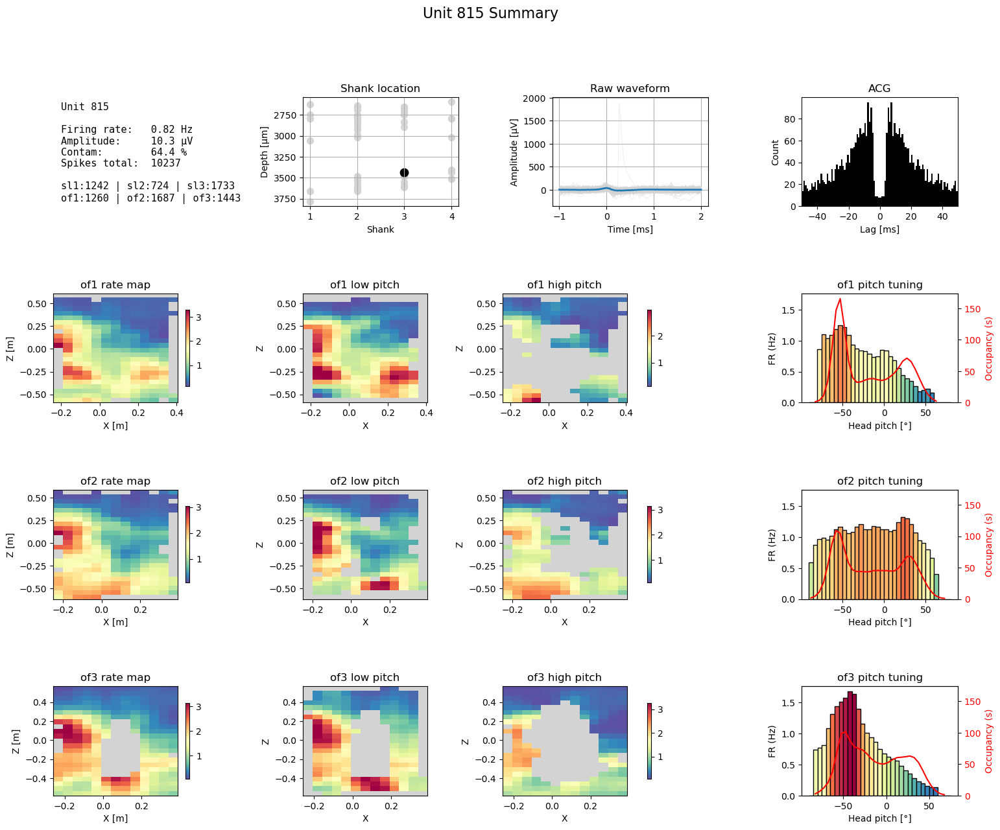

...

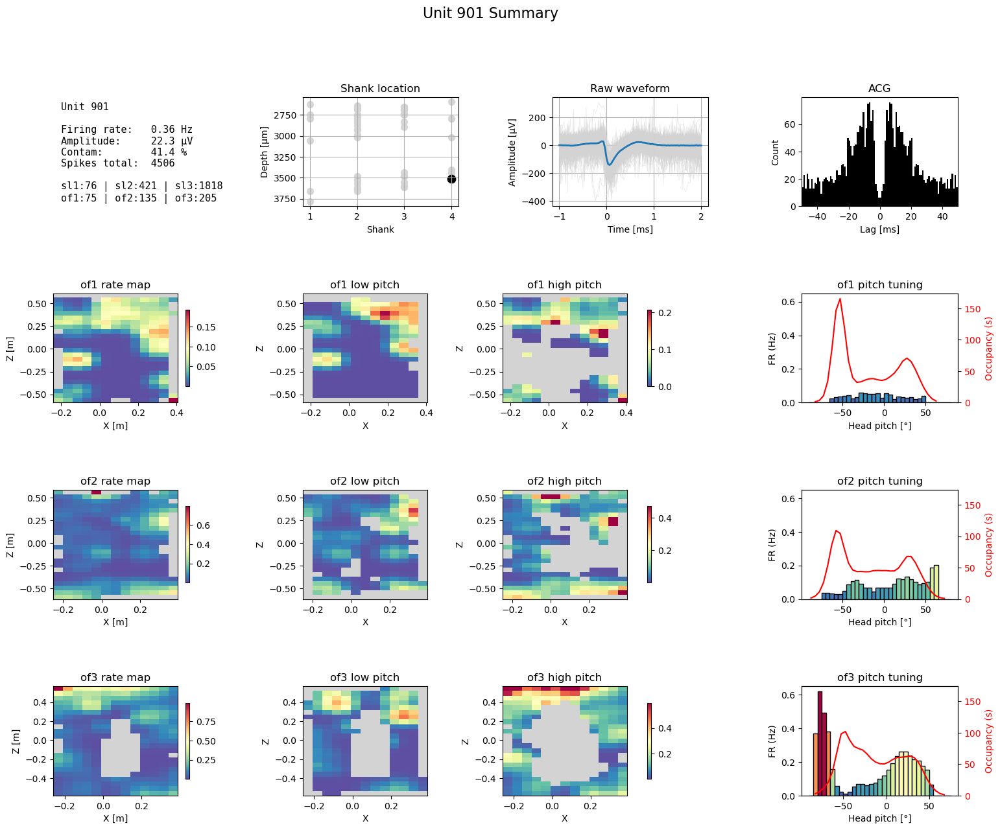

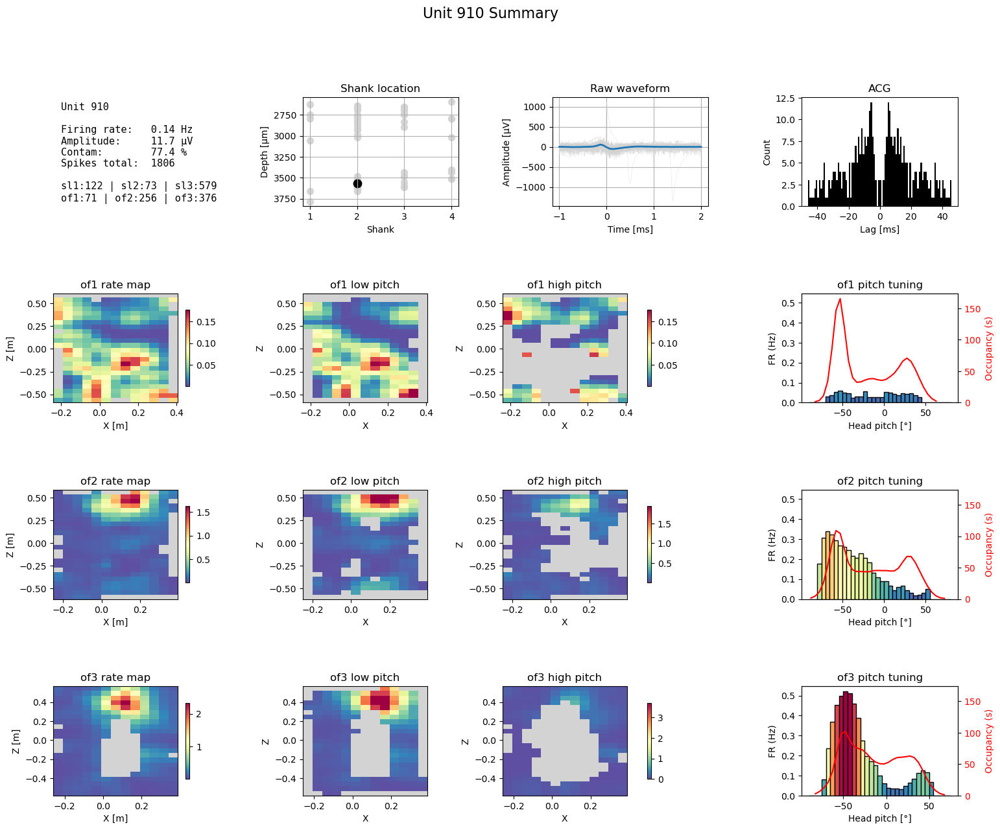

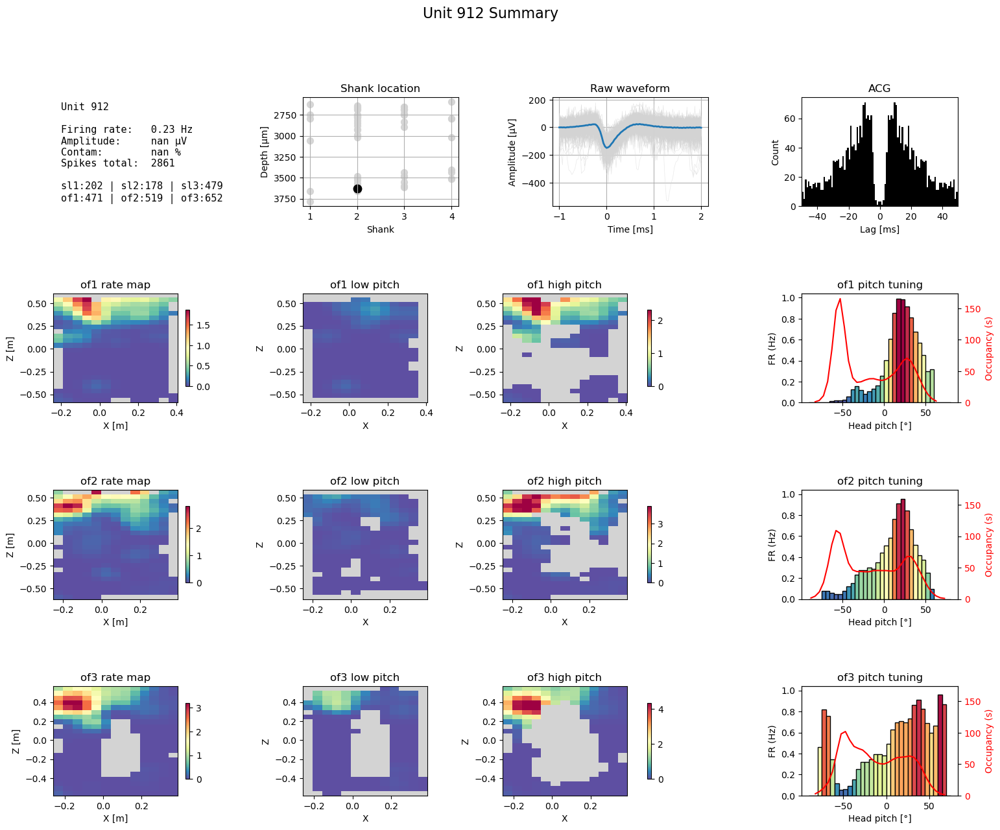

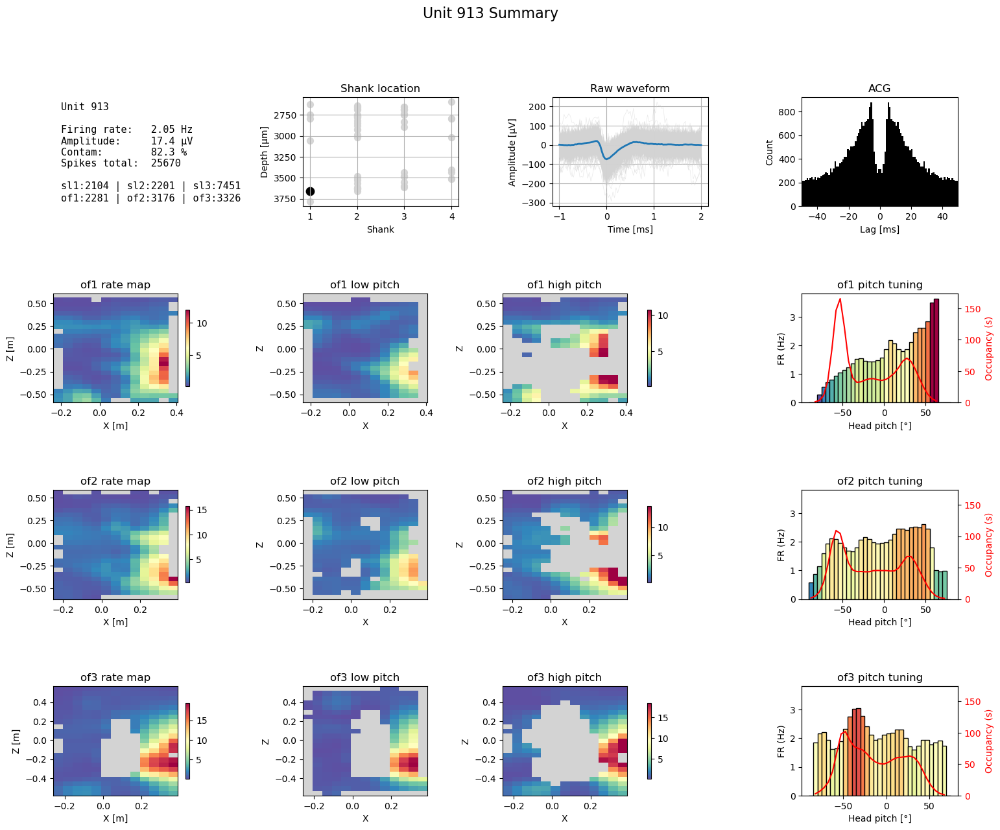

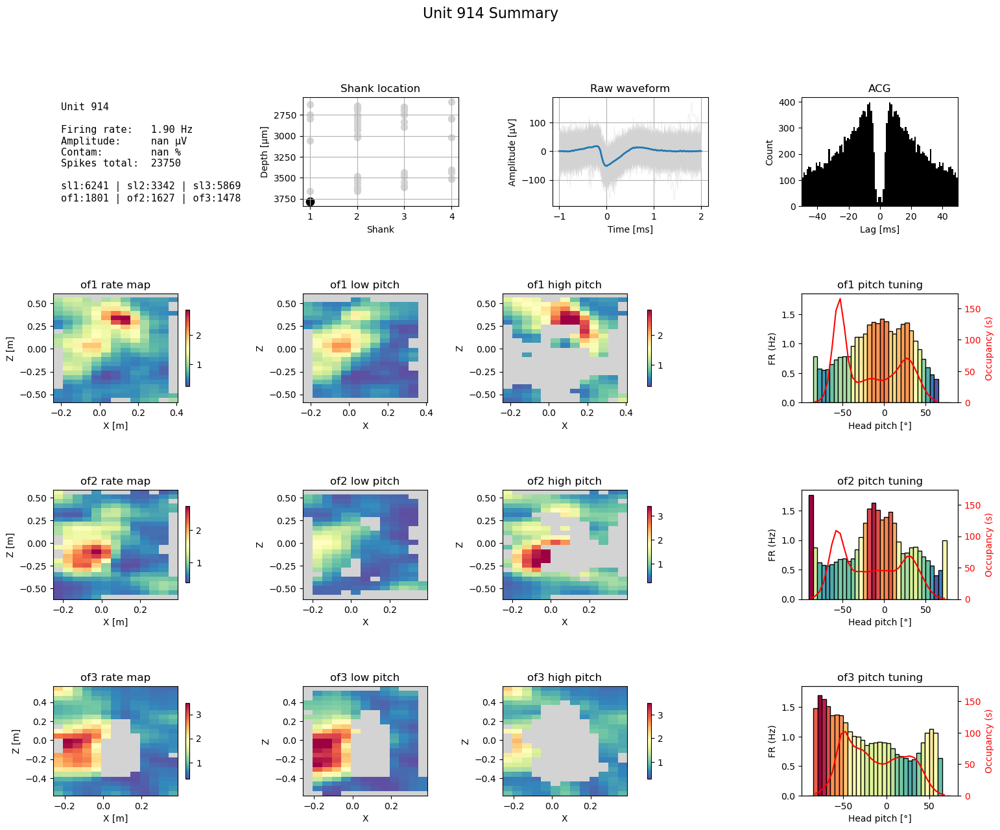

In [28]:
for unit in uoi:
    
    plot_summary_figure(unit,
                        shanks_loc,
                        clusters_info,
                        wf_all,
                        mean_wf_all,
                        acg_dict,
                        rm_dict,
                        rm_dict_pitch,
                        rm_dict_pitch1D,
                        ofs=['of1', 'of2', 'of3'],
                        save_path=Path(units_path))